## notebook for plotting the citation patterns of a single conference

revisions from v0:

* DONE - fix venue name entry: CoRR
* DONE - have venue name indicate conf or journal (-c, -j suffix) 
* DONE - clean up the data structure and groupbys 
* (no longer needed?) normalize heatmaps, compute entropy
* DONE export one single graph for incoming/outgoing citations
* DONE generate network layout for the graph above
* DONE - auto save and name the plots
* DONE - code to generate blog posts

processing

* figs for PLDI
* figs for ML conferences
* figs for ACM MM

* DONE new MAG data


In [2]:
import os, sys
import pandas as pd
from datetime import datetime 
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import pickle
import json

# initilize plotting packages: seaborn

import seaborn as sns
import matplotlib.pyplot as plt
sns.set()

%matplotlib inline

conf = 'SIGIR'
#conf = 'PLDI'
#conf = 'NIPS'
#conf = 'ACL'
#conf = 'MM'
data_dir = './data'

plot_dir = '/Users/xlx/SkyDrive/Repositories/cmLab/static/img/citation' #'./plots'
post_dir = '/Users/xlx/SkyDrive/Repositories/cmLab/content/citation'

if not os.path.exists(os.path.join(plot_dir, conf)):
    os.makedirs(os.path.join(plot_dir, conf))


input data: 

* dataframes: paper, citing, cited
* conference + journal --> df_venue, displaynames

4082 38427 105599
1283 conferences and 23404 journals found in db
      VenueID VenueName
c 0  42C0AB71      PAKM
  1  42DBFEF6       SWS
  2  42F4C8D1    ACIIDS
  3  4366C780      ICGI
  4  43742018      CTIC
          VenueID                                          VenueName
j 24682  3B5E5672                        Medicina Veterinaria-recife
  24683  3B6C2D0B                 Emj-engineering Management Journal
  24684  3B80ECF8  Eklem Hastaliklari Ve Cerrahisi-joint Diseases...
  24685  3D88A422                              Medicina-buenos Aires
  24686  3DCAB9BD                                Lecciones y Ensayos
24687
changing this entry: 
          VenueID                                   VenueName
j 19255  0B68DB42  Clinical Orthopaedics and Related Research
to this entry: 
          VenueID VenueName
j 19255  0B68DB42      CoRR
    PaperID                                          TitleOrig  \
0  5A45F8B7  Show, Attend and Tell: Neural Image Caption Ge...   
1  5AA614A7  A Bayes

/Users/xlx/anaconda/lib/python3.5/site-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


FileNotFoundError: [Errno 2] No such file or directory: '/Users/xlx/SkyDrive/Repositories/cmLab/static/img/citation/CIKM/CIKM_cnt_paper.png'

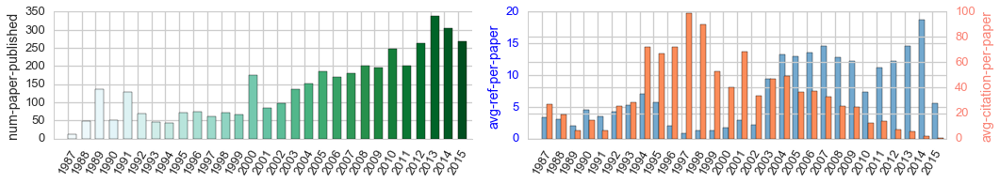

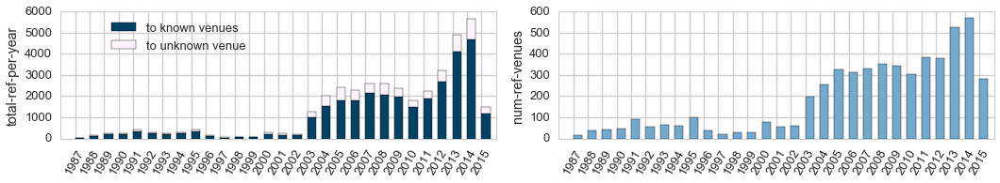

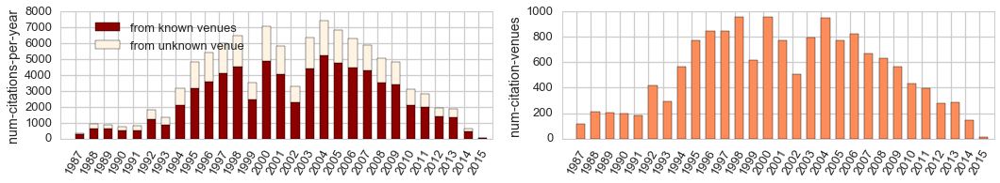

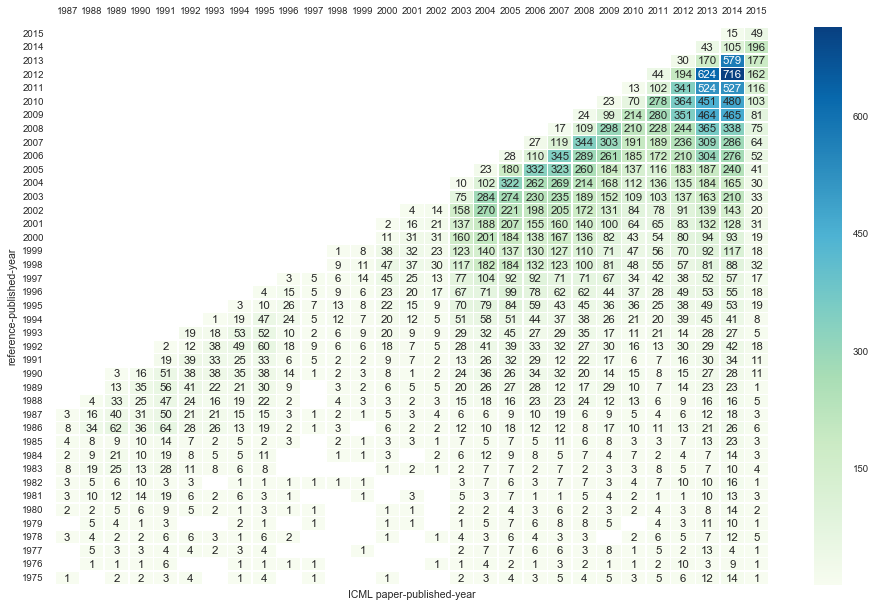

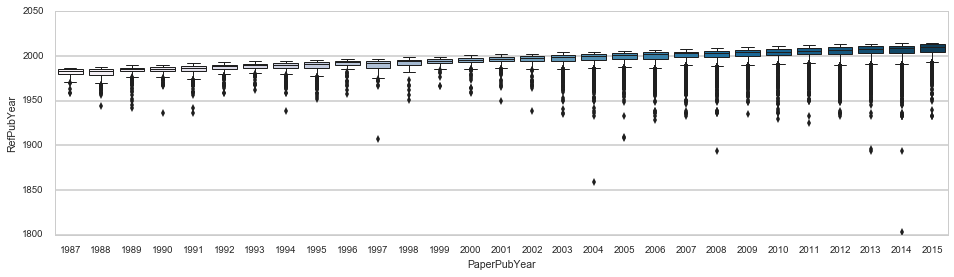

...

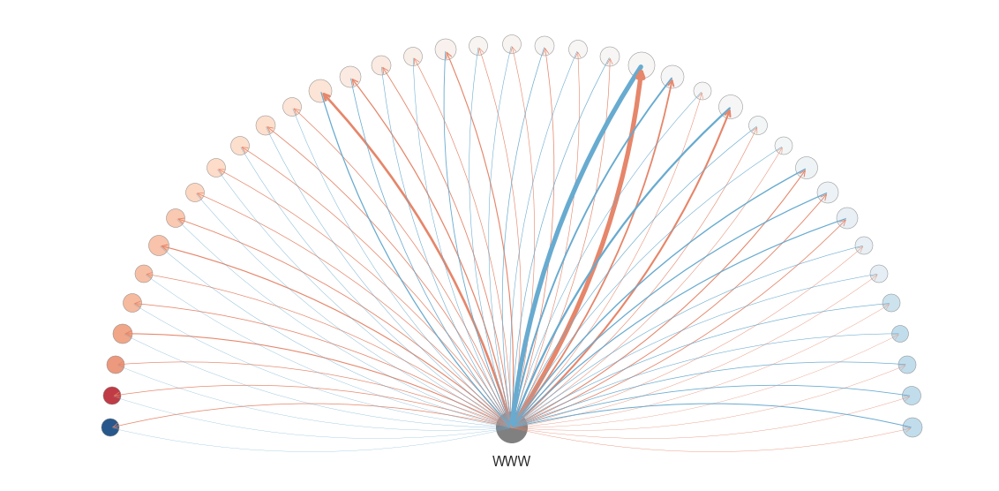

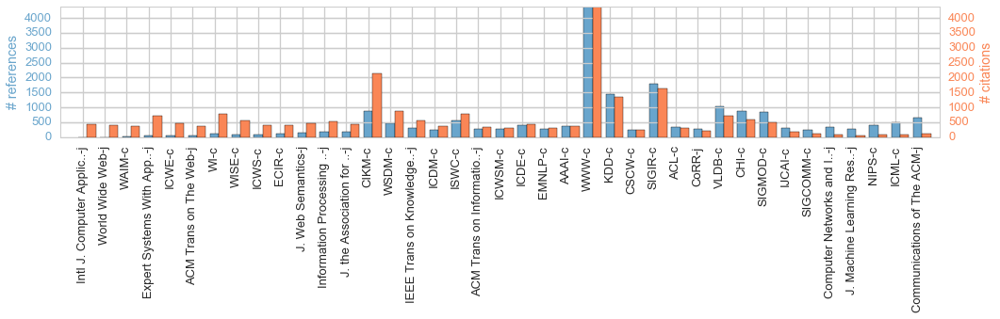

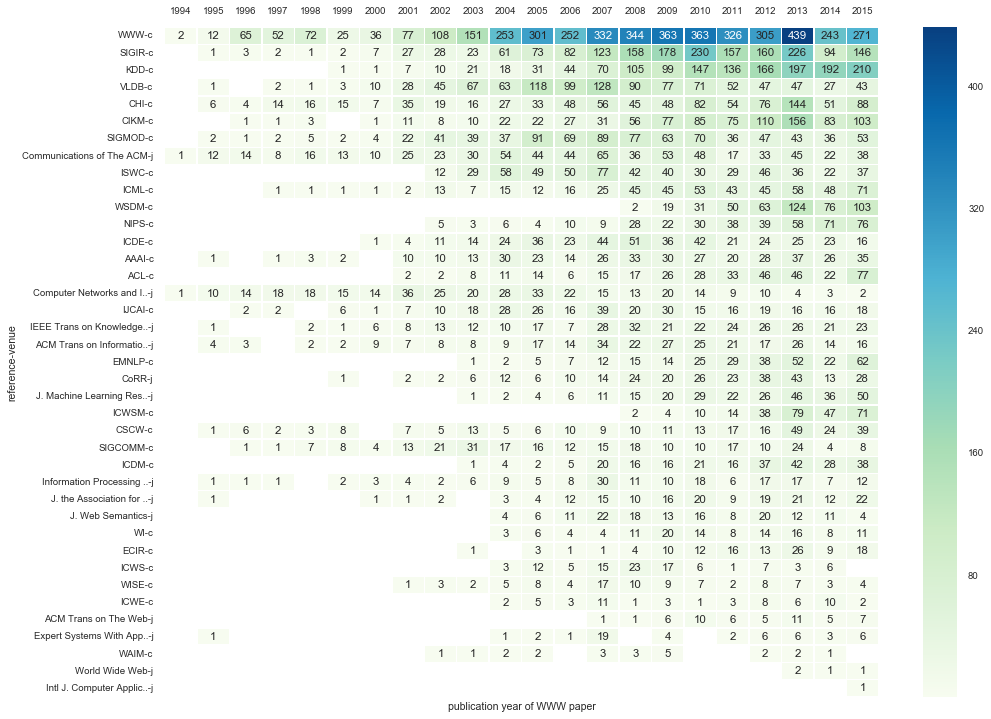

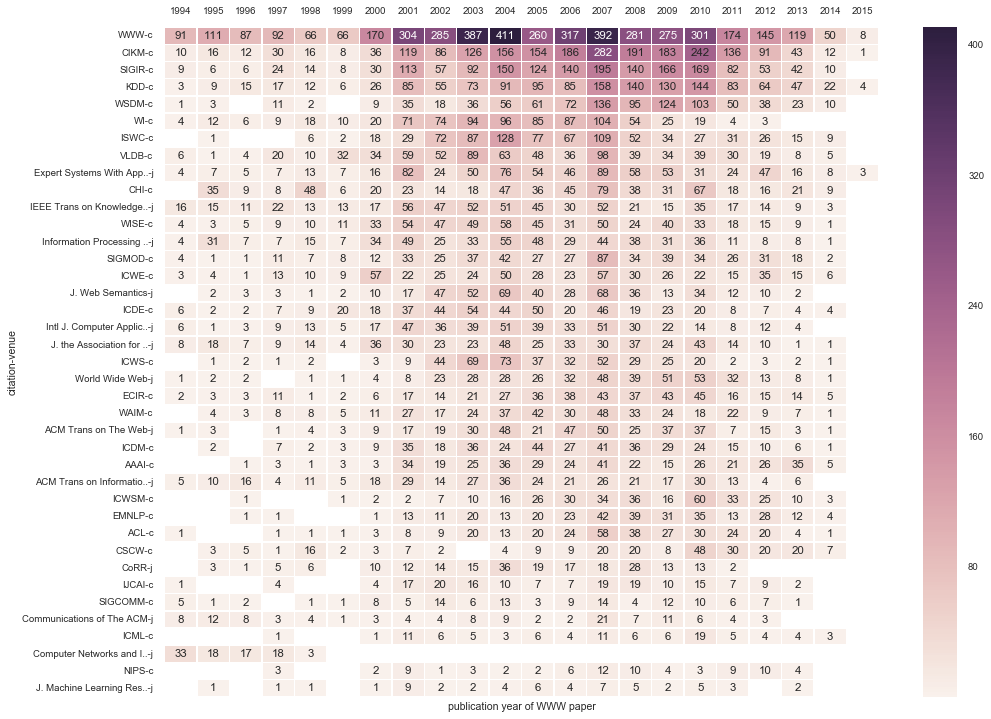

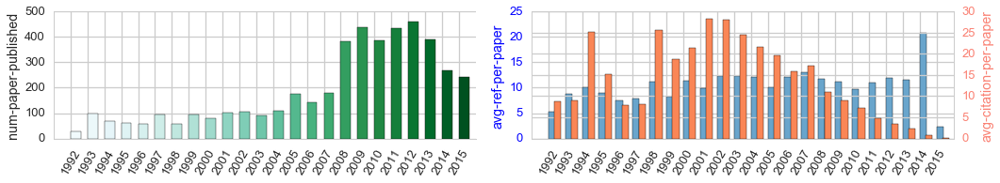

In [4]:
conf_list = ['ICML', 'NIPS', 'SIGIR', 'PLDI', 'MM', 'ACL', 'EMNLP', 'WSDM', 'WWW', 'CIKM', 'CVPR']

for conf in conf_list:
    d = pickle.load( open(os.path.join(data_dir, 'cite_records.'+conf+".pkl"), 'rb') )
    # pickle.dump({"name":c, 'citing':dfx_citing, "cited":dfx_cited, "paper":df_paper}, 
    #           open(os.path.join(data_dir, 'cite_records.'+c+".pkl"), 'wb') ) 

    df_citing = d['citing']
    df_cited = d['cited']
    df_paper = d['paper']

    print(len(df_paper), len(df_citing), len(df_cited))

    conf_file = os.path.join(data_dir, 'Conferences.txt')
    conf_df = pd.read_table(conf_file, header=None, names=['ConfID', 'Abbrv', 'FullName'])

    jnl_file = os.path.join(data_dir, 'Journals.txt')
    jnl_df = pd.read_table(jnl_file, header=None, names=['JournalID', 'FullName'])

    print("{} conferences and {} journals found in db".format(len(conf_df), len(jnl_df)) )

    num_conf = len(conf_df)

    df_venue = pd.concat([ conf_df[['ConfID', 'Abbrv']].rename(columns = {'Abbrv':'VenueName', 'ConfID':"VenueID"}), 
                        jnl_df.rename(columns = {'FullName':'VenueName', 'JournalID':"VenueID"}, 
                                      index = dict(zip(list(jnl_df.index), [x+num_conf for x in list(jnl_df.index)])), 
                                      inplace=False) ], 
                        keys=['c', 'j'])

    print( df_venue.head() ) 
    print (df_venue.tail())
    print(len(df_venue))

    # find the id of the current conference
    row = conf_df.loc[conf_df['Abbrv'] == conf]
    conf_id = list(row['ConfID'])[0]

    """correct one acronym err as per discusion with Alex Wade at MSR -- 2016-02-24
    Clinical Orthopaedics and Related Research  --> CoRR
    """

    ifix = np.nonzero(df_venue['VenueName'] == "Clinical Orthopaedics and Related Research" )[0]
    print("changing this entry: ")
    print( df_venue.iloc[ ifix] ) 
    print("to this entry: ")
    df_venue.set_value(('j', ifix[0]), 'VenueName', 'CoRR')
    print( df_venue.iloc[ifix] ) 


    """ now generate dictionaries for display names: ID--> display; and VenueName--> display
    """
    id2display = dict.fromkeys(list(df_venue['VenueID']))
    name2display = dict.fromkeys(list(df_venue['VenueName']))

    cnt = 0 
    for index, row in df_venue.iterrows():
        v = row['VenueID']
        m = row['VenueName']
        m1 = m.replace('The Journal of', 'J.').replace('Journal of', 'J.').replace('Journal', 'J')
        m2 = m1.replace('Proceedings of', 'Proc.').replace('Proceedings', 'Proc')
        m3 = m2.replace('Annals of', 'A.').replace('Annals', 'A')
        m3 = m3.replace('Review', 'Rev').replace('Transactions', 'Trans')
        m3 = m3.replace('International', 'Intl').replace('National', 'Nat')
        m4 = m3 if len(m3)<=25 else m3[:23]+".."
        ds = m4+"-"+index[0]
        id2display[v] = ds
        name2display[m] = ds
        cnt += 1
        #if cnt>=24800: 
        #    print([v, m, ds])

    print( df_paper.head() )
    print( df_citing.head() )
    print( df_cited.head() )

    refyear_citing = df_citing.groupby(['PaperPubYear', 'RefPubYear'], sort=True)
    refyear_citing['RefID'].count()
    print( np.unique(df_paper['PubYear'] ) ) 
    print( np.unique(df_citing['PaperPubYear'] ) ) 
    print( np.unique(df_citing['RefPubYear'] ) )

    paper_years = np.unique(df_citing['PaperPubYear'] )
    paper_count = df_paper['PubYear'].value_counts(sort=False)[paper_years]

    ref_pp = np.array( df_citing['PaperPubYear'].value_counts(sort=False)[paper_years]/paper_count )
    cit_pp = np.array( df_cited['RefPubYear'].value_counts(sort=False)[paper_years]/paper_count )

    print(paper_years)
    print(paper_count.head())
    print( ref_pp[:5])
    print( cit_pp[:5])

    # data profile: # of papers published per year, citations per year

    plt.figure(figsize=(15, 3))
    cur_dpi=100
    # # of papers over years; # of references and # of citations over years
    # # of citings over years, w/wo venues; # of citing venues over years
    # # of citations over publication years, w/wo venues; # of venues over years

    bar_colrs1 = sns.color_palette("BuGn", len(paper_years))
    bar_colrs2 = sns.color_palette("OrRd", len(paper_years))
    bar_colrs3 = sns.color_palette("PuBu", len(paper_years))
    mdx = int(len(bar_colrs1)/2) # index of the middle bar color
    x_pos = [x+1 for x in range(len(paper_years))]

    """# papers per year"""

    sns.set_context("talk", font_scale=1.)
    sns.set_style("whitegrid")
    sns.despine()

    ax = plt.subplot(1, 2, 1)

    rects1 = ax.bar(x_pos, np.array(paper_count), width=.6, color=bar_colrs1)
    ax.set_ylabel('num-paper-published')
    tk1 = plt.xticks(x_pos, paper_years, rotation=60) 

    """# of references and # of citations over years"""
    ax2 = plt.subplot(1, 2, 2)

    sns.set_style("whitegrid")
    sns.despine()

    rects2 = ax2.bar(x_pos, ref_pp, width=.4, color=bar_colrs3[mdx])

    ax2a = ax2.twinx()
    rects2a = ax2a.bar([x+.35 for x in x_pos], cit_pp, width=.4, color=bar_colrs2[mdx])

    tk2 = plt.xticks([],[])
    ax2.set_xticks(x_pos)
    ax2.set_xticklabels(paper_years, rotation=60)

    ax2.set_ylabel('avg-ref-per-paper', color='b')
    ax2a.set_ylabel('avg-citation-per-paper', color='salmon')
    for tl in ax2.get_yticklabels():
        tl.set_color('b')
    for tl in ax2a.get_yticklabels():
        tl.set_color('salmon') 
    plt.tight_layout()
    plt.savefig(os.path.join(plot_dir, conf, conf+'_cnt_paper.png'), dpi=cur_dpi, transparent=True)    

    """# of citings over years, w/wo venues; # of citing venues over years"""    
    plt.figure(figsize=(15, 3))

    ax3 = plt.subplot(1, 2, 1)
    sns.set_context("talk", font_scale=1.)
    sns.set_style("whitegrid")

    citing_not_null = [] #np.zeros((1, len(years)), dtype=np.int)
    citing_num_null = [] #np.zeros((len(years), 1), dtype=np.int)
    cnt = 0 
    for name, gf in df_citing.groupby(['PaperPubYear']):
        #print(gf.head())
        #print(len(gf), len ( gf['RefVenueID'][gf['RefVenueID'] != ''] ), len ( gf['RefVenueID'][gf['RefVenueID'] == ''] )) 
        citing_not_null.append( len ( gf['RefVenueID'][gf['RefVenueID'] != ''] ) )
        citing_num_null.append( len ( gf['RefVenueID'][gf['RefVenueID'] == ''] ) )

    print(citing_not_null, citing_num_null)    
    m1 = max(mdx+3, len(bar_colrs3)-1)
    m2 = min(mdx-3, 0)
    rects3a = ax3.bar(x_pos, citing_not_null, width=.6, color=bar_colrs3[m1])
    rects3b = ax3.bar(x_pos, citing_num_null, width=.6, color=bar_colrs3[m2], bottom=citing_not_null)

    tk3 = plt.xticks(x_pos, paper_years, rotation=60) 
    ax3.set_ylabel('total-ref-per-year')
    plt.legend((rects3a[0], rects3b[0]), 
               ('to known venues', 'to unknown venue'), bbox_to_anchor=(.45, 1))

    ax4 = plt.subplot(1, 2, 2)
    sns.set_style("whitegrid")

    venue_counts = np.zeros( len(paper_years) )
    for name, gf in df_citing[df_citing['RefVenueID'] != ''].groupby(['PaperPubYear']):
        idy = np.where(paper_years==name)
        if idy[0].size:
            venue_counts[idy] = len( gf['RefVenueID'].value_counts() )
        #venue_counts.append( len( gf['RefVenueID'].value_counts() ) )

    rects4 = ax4.bar(x_pos, venue_counts, width=.6, color=bar_colrs3[mdx])

    tk4 = plt.xticks(x_pos, paper_years, rotation=60)
    ax4.set_ylabel('num-ref-venues')

    plt.tight_layout()
    plt.savefig(os.path.join(plot_dir, conf, conf+'_cnt_ref.png'), dpi=cur_dpi, transparent=True)    

    """# of citations over publication years, w/wo venues; # of venues over years"""

    plt.figure(figsize=(15, 3))

    ax5 = plt.subplot(1, 2, 1)
    sns.set_style("whitegrid")

    citations_not_null = [] 
    citations_num_null = [] 
    for name, gf in df_cited.groupby(['RefPubYear']):
        #print(gf.head())
        # print(name, len(gf), len ( gf['PaperVenueID'][gf['PaperVenueID'] != ''] ), len ( gf['PaperVenueID'][gf['PaperVenueID'] == ''] )) 
        if name in paper_years:    
            citations_not_null.append( len ( gf['PaperVenueID'][gf['PaperVenueID'] != ''] ) )
            citations_num_null.append( len ( gf['PaperVenueID'][gf['PaperVenueID'] == ''] ) )

    print(citations_not_null, citations_num_null)
    print(len(citations_not_null), len(citations_num_null))


    rects5a = ax5.bar(x_pos, citations_not_null, width=.6, color=bar_colrs2[m1])
    rects5b = ax5.bar(x_pos, citations_num_null, width=.6, color=bar_colrs2[m2], bottom=citations_not_null)

    tk5 = plt.xticks(x_pos, paper_years, rotation=60) 
    ax5.set_ylabel('num-citations-per-year')
    plt.legend((rects5a[0], rects5b[0]), 
               ('from known venues', 'from unknown venue'), bbox_to_anchor=(.45, 1))

    ax6 = plt.subplot(1, 2, 2)
    sns.set_style("whitegrid")

    venue_counts = np.zeros( len(paper_years) )
    for name, gf in df_cited[df_cited['PaperVenueID'] != ''].groupby(['RefPubYear']):
        idy = np.where(paper_years==name)
        if idy[0].size:
            venue_counts[idy] = len( gf['PaperVenueID'].value_counts() )
        #if name in paper_years:    
        #    venue_counts.append( len( gf['PaperVenueID'].value_counts() ) )

    rects6 = ax6.bar(x_pos, venue_counts, width=.6, color=bar_colrs2[mdx])

    tk6 = plt.xticks(x_pos, paper_years, rotation=60)
    ax6.set_ylabel('num-citation-venues')
    plt.tight_layout()
    plt.savefig(os.path.join(plot_dir, conf, conf+'_cnt_citation.png'), dpi=cur_dpi, transparent=True)    

    print('{} paper papers from {} to {}, citing {} others, avg {:0.2f} references per paper'.format(
            len(df_paper), df_paper['PubYear'].min(), df_paper['PubYear'].max(), len(df_citing), len(df_citing)/len(df_paper)))
    grouped_citing = df_citing.groupby(['PaperPubYear'], sort=True)
    grouped_citing.count()
    len(grouped_citing)

    refpubyear_count = pd.DataFrame(data=None, index=np.unique(df_citing['RefPubYear'] ), 
                                        columns=paper_years, dtype='int32')
    for name, gf in grouped_citing:
        if name in paper_years:    
            refpubyear_count[name] = gf['RefPubYear'].value_counts(sort=True)
        #print("{}: {} references across {} years".format(name, len(gf), len(gf['RefPubYear'].value_counts())) )

    plt.figure(figsize=(16, 10))
    sns.set_context("poster", font_scale=0.6) #rc={"lines.linewidth": 2.5}

    """ # the view of everthing
    sns.heatmap(refpubyear_count, linewidths=.5, yticklabels=3)
    ax.xaxis.tick_top()
    ax.invert_yaxis()
    sns.axlabel(conf + ' paper-published-year', 'reference-published-year')
    """

    # the subset of reference years
    ax = sns.heatmap(refpubyear_count.loc[1975:2015], linewidths=.5, annot=True, fmt=".0f", cmap="GnBu")
    ax.xaxis.tick_top()
    ax.invert_yaxis()
    sns.axlabel(conf + ' paper-published-year', 'reference-published-year')

    plt.savefig(os.path.join(plot_dir, conf, conf+'_year_ref.png'), transparent=True)

    # box plot 
    plt.figure(figsize=(16, 4))
    axb = sns.boxplot(x="PaperPubYear", y="RefPubYear", data=df_citing, 
                     linewidth=1., palette=bar_colrs3)
    plt.savefig(os.path.join(plot_dir, conf, conf+'_box_ref.png'), transparent=True)
    
    ### citation year heatmap
    print('{} paper papers from {} to {}, cited {} time, avg {:0.2f} cites per paper'.format(
            len(df_paper), df_paper['PubYear'].min(), df_paper['PubYear'].max(), len(df_cited), len(df_cited)/len(df_paper)))
    grouped_cited = df_cited.groupby(['RefPubYear'], sort=True)
    #print( grouped_cited.count() )
    #len(grouped_cited)

    cite_pubyear_count = pd.DataFrame(data=None, index=np.unique(df_cited['PaperPubYear'] ), 
                                        columns=paper_years, dtype='int32')
    for name, gf in grouped_cited:
        if name in paper_years:    
            cite_pubyear_count[name] = gf['PaperPubYear'].value_counts(sort=True)
        #print("{}: {} citations across {} years".format(name, len(gf), len(gf['PaperPubYear'].value_counts())) )

    plt.figure(figsize=(16, 10))
    sns.set_context("poster", font_scale=0.6) #rc={"lines.linewidth": 2.5}

    ax = sns.heatmap(cite_pubyear_count.loc[1975:2016], linewidths=.5, annot=True, fmt=".0f")
    sns.axlabel(conf + ' paper-published-year', 'citation-published-year')
    ax.xaxis.tick_top()
    ax.invert_yaxis()

    plt.savefig(os.path.join(plot_dir, conf, conf+'_year_citation.png'), transparent=True)


    ### code to break down by ref/citation venues

    """ refs and citation data frames
    PaperID     RefID  PaperPubYear  PaperConfID  RefPubYear RefVenueID
    0  01C7AF88  5DF47FD5          2014      4332078        2005           
    1  0419D273  69802989          2013      4332078        1983           
    2  04C8255A  707FA05D          2011      4332078        2008   46A355BA
    3  06E27F4E  5D781F7D          2014      4332078        2000    5686292
    4  07E16ECA  5ACD83EA          2012      4332078        2005   4332078E

    PaperID     RefID  RefPubYear  RefConfID  PaperPubYear PaperVenueID
    0  0007A307  6F46CC0D        2000    4332078          2003             
    1  001D62B0  5C4CC440        2002    4332078          2014     0140E2D3
    2  002545D4  685D7FC2        1999    4332078          2005             
    3  002E73A6  6978437E        2007    4332078          2009             
    4  004344D3  5CCE3A13        1990    4332078          1991             

    goal of this sec: groupby venue and count
    """

    topK = 25 #50 
    numRef = len(df_citing)
    numCite = len(df_cited)

    # figure out the top venues for both ref and citations
    gv_citing = df_citing.groupby(['RefVenueID'], sort=True)
    venue_ref_cnt = gv_citing['PaperID'].count().sort_values(ascending=False)
    allvenue_ref = [s for s in venue_ref_cnt.index if len(s)]

    gv_cited = df_cited.groupby(['PaperVenueID'], sort=True)
    venue_citation_cnt = gv_cited['PaperID'].count().sort_values(ascending=False)
    allvenue_citation = [s for s in venue_citation_cnt.index if len(s)]

    venue_topK = list(set(allvenue_ref[:topK] + allvenue_citation[:topK]))
    print('{} top-{} venues, union of reference and citations.'.format(len(venue_topK), topK) )

    # build a graph structure for the above

    venueG = nx.DiGraph()
    refG = nx.DiGraph()
    citeG = nx.DiGraph()

    venue_metric = dict()
    venue_ref = dict()
    venue_citation = dict()

    """
        construct venue graphs, and 
        compute the in/out citation metric 
    """
    for v in venue_topK:
        vname = id2display[v]
        r = venue_ref_cnt[v] if v in venue_ref_cnt else 1
        refG.add_edge(conf, vname, weight= int(r) )
        venueG.add_edge(conf, vname, weight= float(r/numRef) )

        c = venue_citation_cnt[v] if v in venue_citation_cnt else 1
        citeG.add_edge(vname, conf, weight= int(c) )
        venueG.add_edge(vname, conf, weight= float(c/numCite) )

        # visualization and meta attributes 
        venue_ref[vname] = float(r) #float(r/numRef)
        venue_citation[vname] = float(c) #float(c/numCite)
        venue_metric[vname] = float(r)/c #float(r/numRef) / float(c/numCite)

    nx.set_node_attributes(venueG, 'citation_out', venue_ref)
    nx.set_node_attributes(venueG, 'citation_in', venue_citation)
    nx.set_node_attributes(venueG, 'citation_flow', venue_metric)

    #nx.write_graphml(venueG, os.path.join(data_dir, 'citeG.'+conf+'.graphml'))
    #nx.write_gexf(venueG, os.path.join(data_dir, 'citeG.'+conf+'.gexf'))



    # plot the above info as a graph with curved edges
    #import matplotlib.patches as mpatches
    from matplotlib import gridspec

    fig = plt.figure(figsize=(16, 8))
    sns.set_context("talk", font_scale=1.)
    sns.set_style("white")
    sns.despine()
    ax = fig.add_subplot(111)

    max_marker = 30
    max_line = 5.
    min_line = 0.25

    num_clrs = 100
    dot_colors = sns.color_palette("RdBu", num_clrs)
    out_edge_color = dot_colors[round(3*num_clrs/4)] #{'r':32, 'g':32, 'b':192}
    in_edge_color = dot_colors[round(1*num_clrs/4)] #{'r':192, 'g':32, 'b':32}

    metric_max = max( [np.abs(np.log10(v)) for v in venue_metric.values()] )
    ref_max = max( venue_ref.values() )
    cite_max = max( venue_citation.values() )
    vol_max = max( [r+c for (r, c) in zip(venue_ref.values(), venue_citation.values())] )
    delta_text = 0.02 

    print(metric_max, ref_max, cite_max, vol_max)

    # plot the root node
    #node_viz[conf] = {'size': flowmax*1.25, 'position':{'x': 0, 'y':0, 'z':0}}
    xroot = 0.
    yroot = 0.
    ax.plot(xroot, yroot, 'o', c=[.5, .5, .5], markersize=1.2*max_marker, fillstyle='full', mec='0.5')
    ax.text(xroot, yroot-5*delta_text, conf, horizontalalignment='center')
    #ax.annotate(conf, xy=(0, 0), xytext=(0, -.1), horizontalalignment='left',
    #            verticalalignment='bottom')

    # generate the layout and plot
    isort = list(np.argsort([venue_metric[id2display[v]] for v in venue_topK]))
    anglelist = np.linspace(np.pi, 0., num=len(isort))
    h_txt = []
    for i,j in enumerate(isort):
        v = venue_topK[j]
        vn = id2display[v]
        xp = np.cos(anglelist[i]) #np.log10(venue_metric[vn])/metric_max
        yp = np.sin(np.abs(anglelist[i])) # np.random.random() 

        # figure out what color and size of the node
        sz = np.round( max_marker * np.log(venue_ref[vn]+venue_citation[vn])/np.log(vol_max) )
        ci = np.log10(venue_metric[vn]-1e-3)/metric_max * num_clrs/2 + num_clrs/2
        #print(anglelist[i], xp, yp, sz, ci, int(ci) )

        # figure out width of the lines
        in_lw = max_line * venue_ref[vn]/ref_max + min_line
        out_lw = max_line * venue_citation[vn]/ref_max + min_line

        # draw connectors/arcs
        ax.annotate("", xy=(xroot, yroot), xycoords='data',
                xytext=(xp, yp), textcoords='data',
                arrowprops=dict(arrowstyle="-", #linestyle="dashed",
                                color=out_edge_color, linewidth=in_lw,
                                connectionstyle="arc3,rad=0.12", ), )

        ax.annotate("", xy=(xp, yp), xycoords='data',
                xytext=(xroot, yroot), textcoords='data',
                arrowprops=dict(arrowstyle="->", #linestyle="dashed",
                                color=in_edge_color, linewidth=out_lw,
                                connectionstyle="arc3,rad=0.12",),)

        # draw the node
        ax.plot(xp, yp, 'o', c=dot_colors[int(ci)], markersize=int(sz), 
                alpha=.9, mec='0.5', mew=.5) 


        # add text labels
        if np.abs(xp)>1e-6 and np.abs(xp)<0.2 :
            yt = yp + .3*delta_text/np.abs(xp)
        else:
            yt = yp + delta_text

        if np.abs(xp)<1e-6:
            xt = xp 
            yt = yp + 5*delta_text
            halign = 'left'
        elif xp>0:
            xt = xp + delta_text
            halign = 'left'
        else:
            xt = xp - delta_text
            halign = 'right'

        h = ax.text(xt, yt, vn, horizontalalignment=halign)
        h_txt.append(h)

    ax.set_xlim((-1.2, 1.2))
    ax.set_ylim((-.1, 1.1))
    ax.axis('off')

    plt.savefig(os.path.join(plot_dir, conf, conf+'_graph.png'), dpi=cur_dpi, transparent=True)

    for h in h_txt:
        h.remove()
    plt.tight_layout()    
    plt.savefig(os.path.join(plot_dir, conf, conf+'_mini_graph.png'), dpi=cur_dpi/2.5, transparent=True)

    ## get the color bar 
    """
        fig = plt.figure(figsize=(6, 2))
        sns.palplot(dot_colors)
        axt = plt.gca()
        xm = axt.get_xlim()
        axt.text(xm[-1], -1.1, 'ref > citation', fontsize=80, horizontalalignment='right')
        axt.text(xm[0], -1.1, 'ref < citation', fontsize=80, horizontalalignment='left')
        axt.text(.5*(xm[0]+xm[-1]), -1.1, 'ref = citation', fontsize=80, horizontalalignment='center')

        plt.tight_layout()
        plt.savefig(os.path.join(plot_dir, conf, 'color_bar.png'), dpi=cur_dpi/2, transparent=True)

    """

    # generate bar graphs visualizing overall in/out citation volume
    plt.figure(figsize=(15, 5))
    sns.set_context("talk", font_scale=1.) #rc={"lines.linewidth": 2.5}
    sns.set_style("whitegrid")
    sns.despine()

    isort = list(np.argsort([venue_metric[id2display[v]] for v in venue_topK]))
    sorted_name_list = [id2display[venue_topK[i]] for i in isort]
    x_venues = [x+1 for x in range(len(venue_topK))]

    ax2 = plt.subplot(1,1,1)

    vbar = ax2.bar([x-.2 for x in x_venues], [venue_ref[v] for v in sorted_name_list], 
                    width=.4, color=bar_colrs3[mdx])
    ax2.set_ylim([0, max([cite_max, ref_max])])

    ax2a = ax2.twinx()
    vbara = ax2a.bar([x+.2 for x in x_venues], [venue_citation[v] for v in sorted_name_list], 
                       width=.4, color=bar_colrs2[mdx])
    ax2a.set_ylim([0, max([cite_max, ref_max])])

    tk2 = plt.xticks([],[])
    ax2.set_xticks(x_venues)
    ax2.set_xticklabels(sorted_name_list, rotation=90)

    ax2.set_ylabel('# references', color=bar_colrs3[mdx])
    ax2a.set_ylabel('# citations', color=bar_colrs2[mdx])
    for tl in ax2.get_yticklabels():
        tl.set_color(bar_colrs3[mdx])
    for tl in ax2a.get_yticklabels():
        tl.set_color(bar_colrs2[mdx]) 
    plt.tight_layout()

    plt.savefig(os.path.join(plot_dir, conf, conf+'_venue_bar.png'), dpi=cur_dpi, transparent=True)

    # accumulate counts for refrences
    refvenue_count = pd.DataFrame(data=None, dtype='int32', index = allvenue_ref, columns = paper_years)

    for name, gf in grouped_citing:
        if name in paper_years:    
            refvenue_count[name] = gf['RefVenueID'].value_counts(sort=True)


    # accumulate counts for citations
    citevenue_count = pd.DataFrame(data=None, index = allvenue_citation, columns = paper_years, dtype='int32')
    for name, gf in grouped_cited:
        if name in paper_years:    
            citevenue_count[name] = gf['PaperVenueID'].value_counts(sort=True)


    # amount of references over time 
    plt.figure(figsize=(16, 12))
    sns.set_context("poster", font_scale=0.6)

    jsort = list(np.argsort([venue_ref[id2display[v]] for v in venue_topK]))
    jsort.reverse()
    sorted_vlist = [id2display[venue_topK[j]] for j in jsort]
    sorted_vid = [venue_topK[j] for j in jsort]

    ax = sns.heatmap(refvenue_count.loc[sorted_vid], linewidths=.5, annot=True, fmt=".0f", cmap="GnBu") 
    ax.xaxis.tick_top()
    sns.axlabel('publication year of ' + conf + ' paper', 'reference-venue')

    yt = ax.set_yticklabels(sorted_vlist[::-1])

    plt.savefig(os.path.join(plot_dir, conf, conf+'_venue_ref.png'), transparent=True)

    # amount of citations over time 
    plt.figure(figsize=(16, 12))
    sns.set_context("poster", font_scale=0.6)

    jsort = list(np.argsort([venue_citation[id2display[v]] for v in venue_topK]))
    jsort.reverse()
    sorted_vlist = [id2display[venue_topK[j]] for j in jsort]
    sorted_vid = [venue_topK[j] for j in jsort]

    ax = sns.heatmap(citevenue_count.loc[sorted_vid], linewidths=.5, annot=True, fmt=".0f") 
    ax.xaxis.tick_top()
    sns.axlabel('publication year of ' + conf + ' paper', 'citation-venue')

    yt = ax.set_yticklabels(sorted_vlist[::-1])

    plt.savefig(os.path.join(plot_dir, conf, conf+'_venue_citation.png'), transparent=True)

    ## code to write markdown posts

    """ 
    name of the post file, and couple of other variables
    """

    post_file = os.path.join(post_dir, conf+".md")
    img_path = "/img/citation"
    conf_full_name = list(conf_df["FullName"][conf_df['Abbrv']==conf])[0]
    img_width = 900

    ph = open(post_file, "wt")

    """  write header for the post
    ---
    title: "Media and News"
    description: "An archive of what others and ourselves think are news-worthy."
    date: "2016-01-02"
    categories:
      - "misc"
    tags:
      - "cm"
    ---
    """
    ph.write("---\n")
    ph.write('title: "{} - {} ({} - {})"\n'.format(conf, conf_full_name, paper_years[0], paper_years[-1]))
    ph.write('description: "Citation pattern stats and plots for this conference."\n'.format(conf, conf_full_name))
    ph.write('date: "{}"\n'.format(datetime.now()))
    ph.write('categories:\n  - "data"\n  - "visualization"\n')
    ph.write('tags:\n  - "citation"\n  - "datasci"\n  - "graph"\n')
    ph.write("---\n\n")

    """ write basic stats
    """

    ph.write('<img style="float:left;" src="{}" '.format(os.path.join(img_path, conf, conf+'_mini_graph.png')))
    ph.write('height="160" hspace="15" vspace="10" alt="{}: summary of top {} venues">\n'.format(conf, len(venue_topK)))
    ph.write('### Stats:\n\n')
    ph.write('* {} years of publication {}--{}, {} papers total\n'.format(len(paper_years), paper_years[0], paper_years[-1], len(df_paper)))
    ph.write('* {} references total, average {} per paper\n'.format(len(df_citing), round(1.*len(df_citing)/len(df_paper), 2)) )
    ph.write('\t* {} reference venues, {}% in top {} \n'.format(len(venue_ref_cnt), 
                                                               np.round(100*venue_ref_cnt[:topK].sum()/venue_ref_cnt.sum()), topK) )
    ph.write('* {} citations total, average {} per paper\n'.format(len(df_cited), round(1.*len(df_cited)/len(df_paper), 2) ))
    ph.write('\t* {} citations venues, {}% in top {} \n'.format(len(venue_citation_cnt), 
                                                               np.round(100*venue_citation_cnt[:topK].sum()/venue_citation_cnt.sum()), topK))
    ph.write(" \n\n")

    fig_summ = open(os.path.join(plot_dir, 'fig_summary.md'), 'rt').read()
    ph.write(fig_summ)

    """ write figures 
    """
    ph.write("### Plots of citation data\n")
    # a list of figures in their order of appearance 
    fig_key = ['cnt_paper', 'cnt_ref', 'cnt_citation', 'graph', 
               'venue_bar', 'venue_ref', 'venue_citation', 'box_ref', 'year_ref']
    fig_info = json.load(open(os.path.join(plot_dir, 'fig_text.json'), 'rt'))

    for i in range(len(fig_key)):
        fn = fig_key[i]
        if fn in fig_info:
            info = fig_info[fn]
        else:
            info = ""

        img_fn = os.path.join(img_path, conf, conf+'_'+fn+'.png')
        ph.write('<a href={}><img width={} src="{}"></a>\n'.format(img_fn, img_width, img_fn))
        if fn == 'graph':
            ph.write('<img align=center width={} src="{}">\n\n'.format(int(0.75*img_width), os.path.join(img_path, 'color_bar.png')))

        ph.write('Fig {}. {}\n'.format(i+1, info) )
        ph.write('\n')

    ph.close()


    """ 
    markdown/html blurb for the overview page
    """
    overview_file = os.path.join(plot_dir, "overview.json")
    overview_info = json.load(open(overview_file, 'rt'))

    img_fn = os.path.join(img_path, conf, conf+'_mini_graph.png')
    s = '{}\n <img align=center width={} src="{}">\n'.format(conf_full_name, 250, img_fn)
    s = '<a href={}>\n\t'.format('/citation/'+conf) + s
    s += '<a>\n'
    s = '<td>\n' + s
    s += '</td>\n'
    overview_info[conf] = s
    print(s)

    json.dump(overview_info, open(overview_file, 'wt'), sort_keys=True, indent=4)

In [ ]:
overview_info = json.load(open(overview_file, 'rt'))
for k in overview_info:
    print(overview_info[k])
    print("\n")
    